In [1]:
from __future__ import print_function
from matplotlib import pyplot as plt
plt.switch_backend('agg')
%matplotlib inline
import numpy as np

from IPython.display import display, HTML
import h5py


In [2]:
def Overlap_calc(hp,sp,psd):
    f_low = 18
    m, i = match(hp, sp, psd=psd, low_frequency_cutoff=f_low)
    o = overlap(hp, sp, psd=psd, low_frequency_cutoff=f_low)
    return m


In [50]:
from pycbc.filter import match, overlap
from pycbc.psd import aLIGOZeroDetHighPower
from pycbc.types.timeseries import TimeSeries
import matplotlib.pyplot as plt

def plot_reconstructed(decoded_signals, pure_signals, strain, m1, m2, snr):
    
    time_buffer = 4
    length_signal = len(decoded_signals)

    f_low = 18
    sample_rate = 2048

    # Length of corresponding time series and frequency series
    tlen = sample_rate * time_buffer
    flen = tlen // 2 + 1

    delta_f = 1.0 / time_buffer
    psd = aLIGOZeroDetHighPower(flen, delta_f, f_low)
    
    X_test_pure_ts = TimeSeries(pure_signals.squeeze(), delta_t = 1.0/2048)
    decoded_signals_ts = TimeSeries(decoded_signals.squeeze(), delta_t = 1.0/2048)

    X_test_pure_ts.resize(tlen)
    decoded_signals_ts.resize(tlen)

    if(X_test_pure_ts.max() != 0.0):
        m = Overlap_calc(X_test_pure_ts,decoded_signals_ts,psd)
    else:
        m = 1
    
    fig = plt.figure(figsize=(10,5))

    time = np.linspace(-0.25, 0.05, length_signal)

    plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.4, 
                    hspace=0.4)

    signal_axes = fig.add_subplot(211)
#    signal_axes.set_ylim(-1.1, 1.1)
    signal_axes.set_title('Mass1 = {m1}, Mass2 = {m2}, S/N = {snr}, Overlap = {m}'.format(m1=np.round(m1,2), m2=np.round(m2,2), snr=np.round(snr,2), m=np.round(m,2)))
    signal_axes.plot(time,strain.squeeze()/100, linewidth=1.2, label ='Whitened Livingston strain', alpha=0.5)
    signal_axes.plot(time,pure_signals.squeeze(), linewidth=1.2, label ='Pure Livingston signal')
    signal_axes.plot(time,decoded_signals.squeeze(), linewidth=1.2, label ='Denoised Livingston signal', c='red', linestyle='dashed')
    signal_axes.set_ylabel('Rescaled Amplitudes')
    signal_axes.legend()

    plt.savefig('IMBH_test/IMRPhenomXPHM_O3b_signal+noise/SNR-30to40/Plot_m1-'+str(int(m1))+'_m2-'+str(int(m2))+'_snr-'+str(int(snr))+'.png', bbox_inches='tight', facecolor='w', transparent=False, dpi=200)


# SNR - 8 to 9

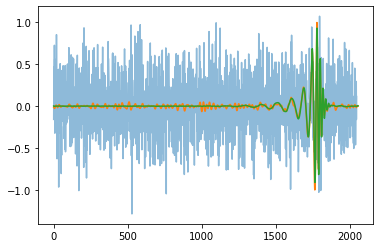

In [22]:
f1 = h5py.File('/fred/oz016/Chayan/GW-Denoiser/evaluation/results_IMBH_IMRPhenomXPHM_10_timesteps_O3b_signal_noise_SNR-all.hdf', 'r')
f2 = h5py.File("/fred/oz016/Chayan/BBH_sample_files/O3b_IMBH_test_IMRPhenomXPHM_signal_noise_SNR-8to9.hdf", "r")

#plt.ylim(-1.1,1.1)

plt.plot(f2['injection_samples']['l1_strain'][0]/100, alpha=0.5)
plt.plot(f1['pure_signals'][0])
plt.plot(f1['denoised_signals'][0])


<ipython-input-48-623c0e5980f7>:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(10,5))


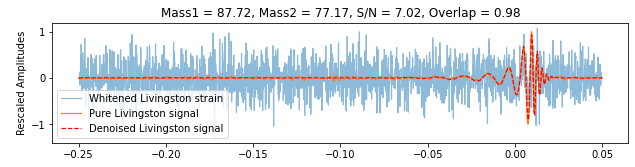

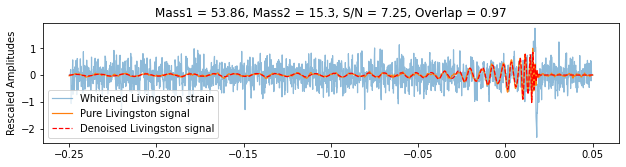

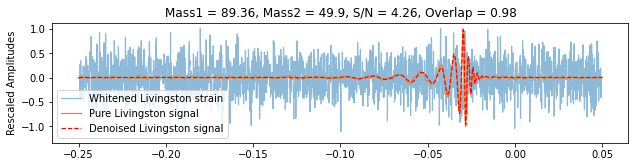

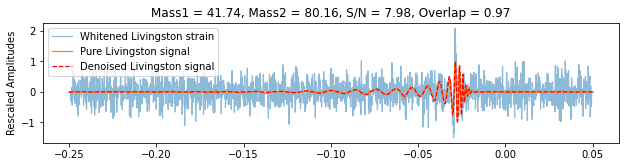

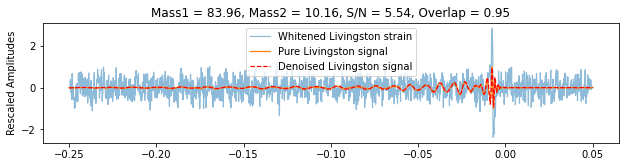

...

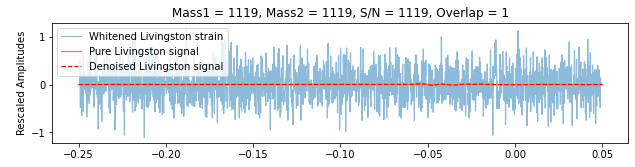

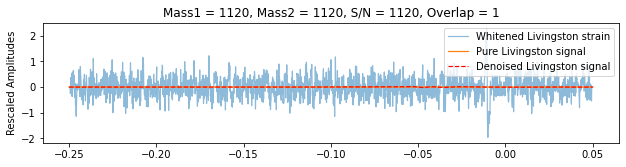

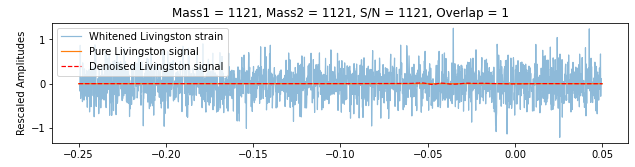

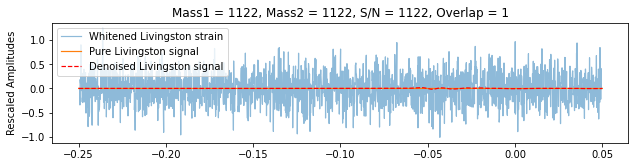

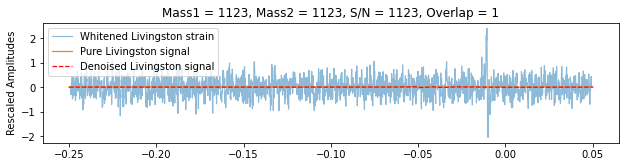

In [49]:
f1 = h5py.File('/fred/oz016/Chayan/GW-Denoiser/evaluation/results_IMBH_IMRPhenomXPHM_10_timesteps_O3b_signal_noise_SNR-all.hdf', 'r')
f2 = h5py.File("/fred/oz016/Chayan/BBH_sample_files/O3b_IMBH_test_IMRPhenomXPHM_signal_noise_SNR-8to9.hdf", "r")

noise_index = range(100,125)
signal_index = range(25)
j = -1
   
for i in range(25):
    decoded_signals = f1['denoised_signals'][i].astype(np.float64)
    pure_signals = f1['pure_signals'][i].astype(np.float64)
    
    j+=1
    
    strain = np.pad(f2['injection_samples']['l1_strain'][j].astype(np.float64), (5,5), constant_values=(0,0))
    
    m1 = f2['injection_parameters']['mass1'][i]
    m2 = f2['injection_parameters']['mass2'][i]
    snr = f2['injection_parameters']['l1_snr'][j]*f2['injection_parameters']['scale_factor'][j]
    
    plot_reconstructed(decoded_signals, pure_signals, strain, m1, m2, snr)

j = -1

for i in range(100,125):
    
    decoded_signals = f1['denoised_signals'][i].astype(np.float64)
    pure_signals = f1['pure_signals'][i].astype(np.float64)
    
    j+=1
    strain = np.pad(f2['noise_samples']['l1_strain'][j].astype(np.float64), (5,5), constant_values=(0,0))
    
    m1 = 999 + i
    m2 = 999 + i
    snr = 999 + i
        
    plot_reconstructed(decoded_signals, pure_signals, strain, m1, m2, snr)
    

# SNR - 9 to 20

<ipython-input-46-5b08f08344cb>:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(10,5))


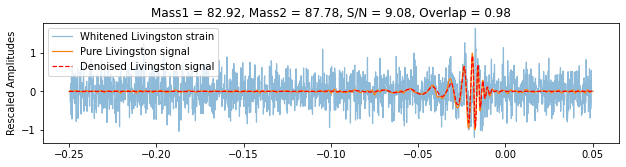

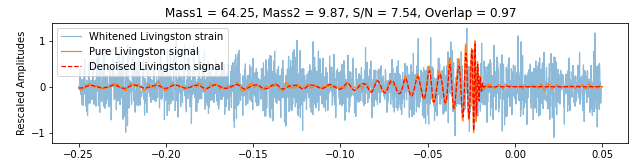

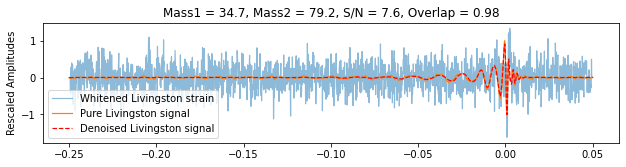

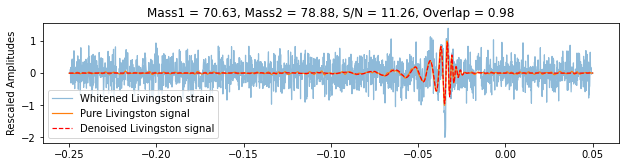

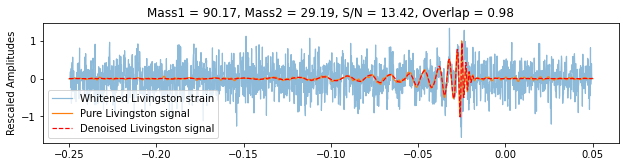

...

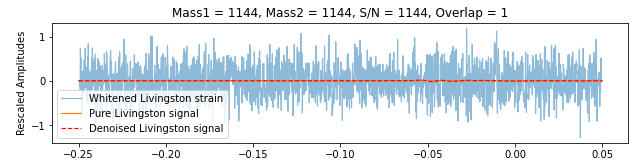

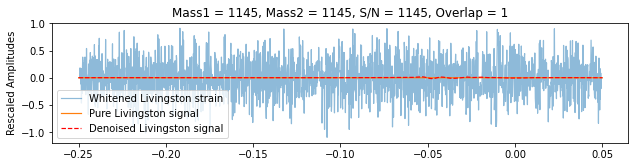

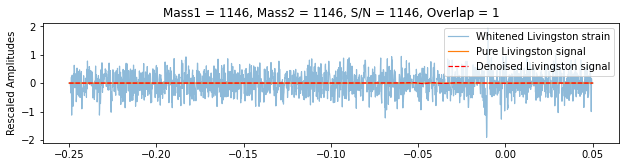

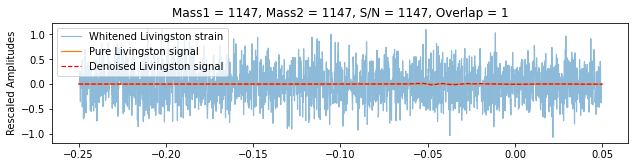

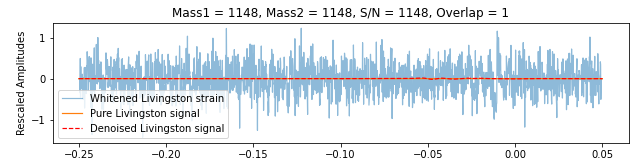

In [47]:
f1 = h5py.File('/fred/oz016/Chayan/GW-Denoiser/evaluation/results_IMBH_IMRPhenomXPHM_10_timesteps_O3b_signal_noise_SNR-all.hdf', 'r')
f2 = h5py.File("/fred/oz016/Chayan/BBH_sample_files/O3b_IMBH_test_IMRPhenomXPHM_signal_noise_SNR-9to20.hdf", "r")

noise_index = range(100,125)
signal_index = range(25)
j = -1
   
for i in range(25,50):
    decoded_signals = f1['denoised_signals'][i].astype(np.float64)
    pure_signals = f1['pure_signals'][i].astype(np.float64)
    
    j+=1
    
    strain = np.pad(f2['injection_samples']['l1_strain'][j].astype(np.float64), (5,5), constant_values=(0,0))
    
    m1 = f2['injection_parameters']['mass1'][j]
    m2 = f2['injection_parameters']['mass2'][j]
    snr = f2['injection_parameters']['l1_snr'][j]*f2['injection_parameters']['scale_factor'][j]
    
    plot_reconstructed(decoded_signals, pure_signals, strain, m1, m2, snr)

j = -1

for i in range(125,150):
    
    decoded_signals = f1['denoised_signals'][i].astype(np.float64)
    pure_signals = f1['pure_signals'][i].astype(np.float64)
    
    j+=1
    strain = np.pad(f2['noise_samples']['l1_strain'][j].astype(np.float64), (5,5), constant_values=(0,0))
    
    m1 = 999 + i
    m2 = 999 + i
    snr = 999 + i
        
    plot_reconstructed(decoded_signals, pure_signals, strain, m1, m2, snr)
    

# SNR - 20 to 30

<ipython-input-43-6428eeb3a203>:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(10,5))


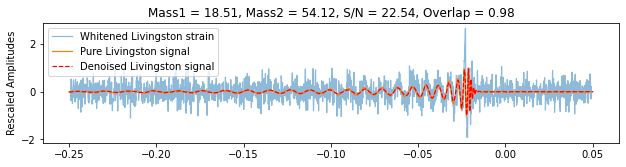

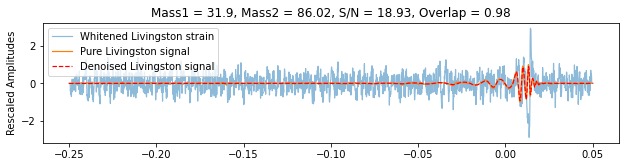

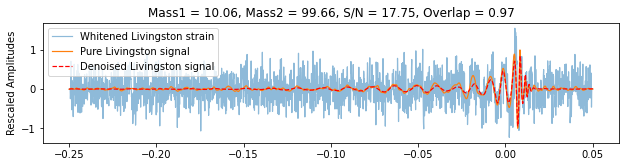

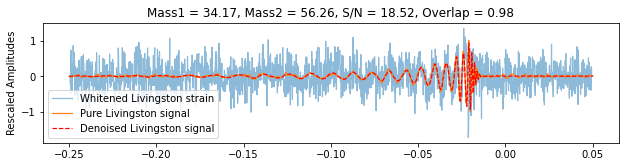

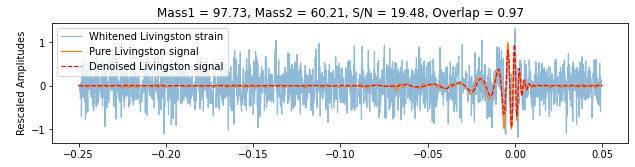

...

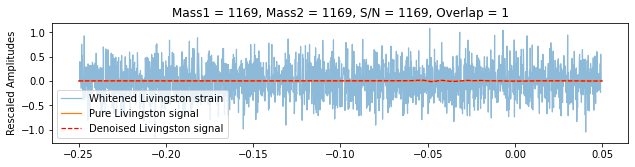

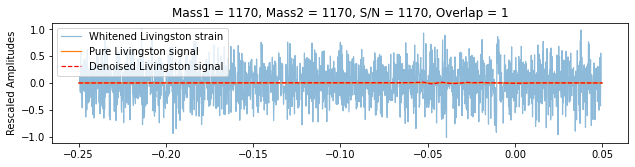

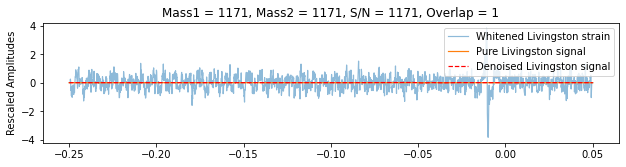

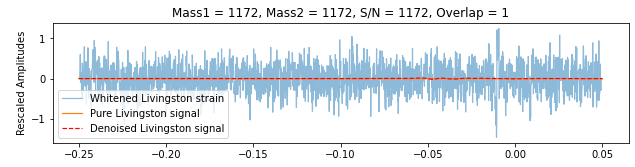

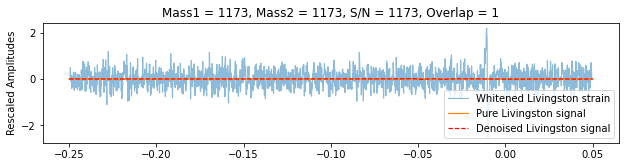

In [45]:
f1 = h5py.File('/fred/oz016/Chayan/GW-Denoiser/evaluation/results_IMBH_IMRPhenomXPHM_10_timesteps_O3b_signal_noise_SNR-all.hdf', 'r')
f2 = h5py.File("/fred/oz016/Chayan/BBH_sample_files/O3b_IMBH_test_IMRPhenomXPHM_signal_noise_SNR-20to30.hdf", "r")

noise_index = range(100,125)
signal_index = range(25)
j = -1
   
for i in range(50,75):
    decoded_signals = f1['denoised_signals'][i].astype(np.float64)
    pure_signals = f1['pure_signals'][i].astype(np.float64)
    
    j+=1
    
    strain = np.pad(f2['injection_samples']['l1_strain'][j].astype(np.float64), (5,5), constant_values=(0,0))
    
    m1 = f2['injection_parameters']['mass1'][j]
    m2 = f2['injection_parameters']['mass2'][j]
    snr = f2['injection_parameters']['l1_snr'][j]*f2['injection_parameters']['scale_factor'][j]
    
    plot_reconstructed(decoded_signals, pure_signals, strain, m1, m2, snr)

j = -1

for i in range(150,175):
    
    decoded_signals = f1['denoised_signals'][i].astype(np.float64)
    pure_signals = f1['pure_signals'][i].astype(np.float64)
    
    j+=1
    strain = np.pad(f2['noise_samples']['l1_strain'][j].astype(np.float64), (5,5), constant_values=(0,0))
    
    m1 = 999 + i
    m2 = 999 + i
    snr = 999 + i
        
    plot_reconstructed(decoded_signals, pure_signals, strain, m1, m2, snr)
    

# SNR - 30 to 40

<ipython-input-25-f08fe878413f>:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(10,5))


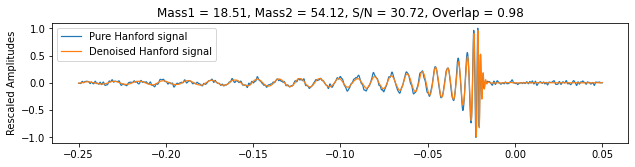

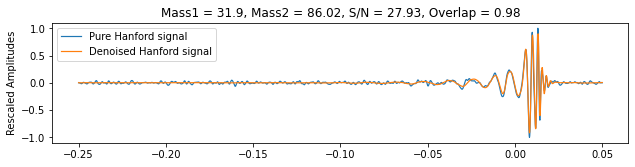

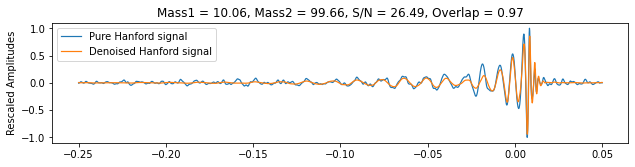

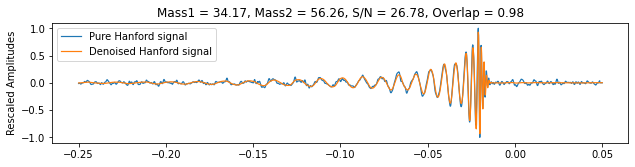

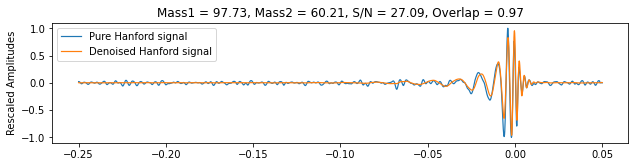

...

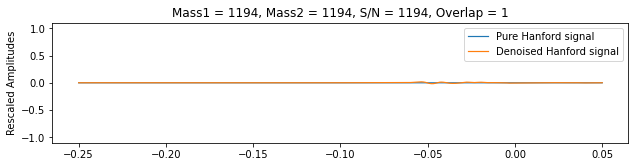

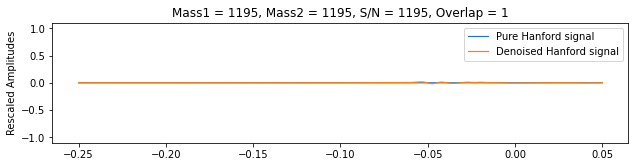

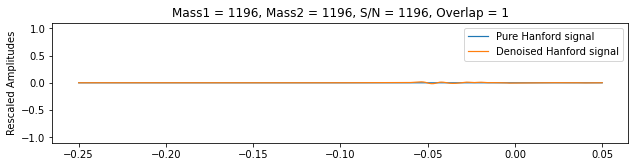

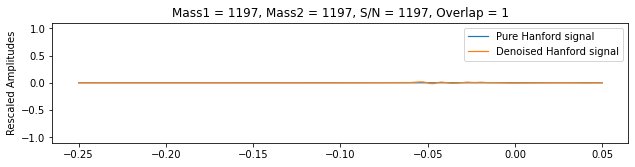

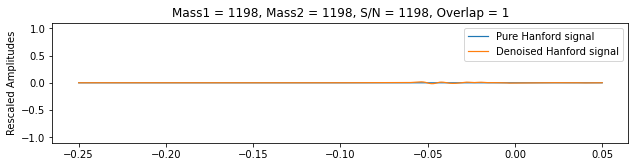

In [26]:
f1 = h5py.File('/fred/oz016/Chayan/GW-Denoiser/evaluation/results_IMBH_IMRPhenomXPHM_10_timesteps_O3b_signal_noise_SNR-all.hdf', 'r')
f2 = h5py.File("/fred/oz016/Chayan/BBH_sample_files/O3b_IMBH_test_IMRPhenomXPHM_signal_noise_SNR-30to40.hdf", "r")

noise_index = range(100,125)
signal_index = range(25)
j = -1
   
for i in range(75,100):
    decoded_signals = f1['denoised_signals'][i].astype(np.float64)
    pure_signals = f1['pure_signals'][i].astype(np.float64)
    
    j+=1
    
    strain = np.pad(f2['injection_samples']['l1_strain'][j].astype(np.float64), (5,5), constant_values=(0,0))
    
    m1 = f2['injection_parameters']['mass1'][j]
    m2 = f2['injection_parameters']['mass2'][j]
    snr = f2['injection_parameters']['l1_snr'][j]*f2['injection_parameters']['scale_factor'][j]
    
    plot_reconstructed(decoded_signals, pure_signals, strain, m1, m2, snr)

j = -1

for i in range(175,200):
    
    decoded_signals = f1['denoised_signals'][i].astype(np.float64)
    pure_signals = f1['pure_signals'][i].astype(np.float64)
    
    j+=1
    strain = np.pad(f2['noise_samples']['l1_strain'][j].astype(np.float64), (5,5), constant_values=(0,0))
    
    m1 = 999 + i
    m2 = 999 + i
    snr = 999 + i
        
    plot_reconstructed(decoded_signals, pure_signals, strain, m1, m2, snr)
    

# New model - dilated CNN, 25 timesteps, MSE+MAE+FT loss

In [3]:
from pycbc.filter import match, overlap
from pycbc.psd import aLIGOZeroDetHighPower
from pycbc.types.timeseries import TimeSeries
import matplotlib.pyplot as plt

def plot_reconstructed(decoded_signals, pure_signals, strain, m1, m2, snr):
    
    time_buffer = 4
    length_signal = len(decoded_signals)

    f_low = 18
    sample_rate = 2048

    # Length of corresponding time series and frequency series
    tlen = sample_rate * time_buffer
    flen = tlen // 2 + 1

    delta_f = 1.0 / time_buffer
    psd = aLIGOZeroDetHighPower(flen, delta_f, f_low)
    
    X_test_pure_ts = TimeSeries(pure_signals.squeeze(), delta_t = 1.0/2048)
    decoded_signals_ts = TimeSeries(decoded_signals.squeeze(), delta_t = 1.0/2048)

    X_test_pure_ts.resize(tlen)
    decoded_signals_ts.resize(tlen)

    if(X_test_pure_ts.max() != 0.0):
        m = Overlap_calc(X_test_pure_ts,decoded_signals_ts,psd)
    else:
        m = 1
    
    fig = plt.figure(figsize=(10,5))

    time = np.linspace(-0.25, 0.05, length_signal)

    plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.4, 
                    hspace=0.4)

    signal_axes = fig.add_subplot(211)
#    signal_axes.set_ylim(-1.1, 1.1)
    signal_axes.set_title('Mass1 = {m1}, Mass2 = {m2}, S/N = {snr}, Overlap = {m}'.format(m1=np.round(m1,2), m2=np.round(m2,2), snr=np.round(snr,2), m=np.round(m,2)))
    signal_axes.plot(time,strain.squeeze()/0.05, linewidth=1.2, label ='Whitened Livingston strain', alpha=0.5)
    signal_axes.plot(time,pure_signals.squeeze(), linewidth=1.2, label ='Pure Livingston signal')
    signal_axes.plot(time,decoded_signals.squeeze(), linewidth=1.2, label ='Denoised Livingston signal', c='red', linestyle='dashed')
    signal_axes.set_ylabel('Rescaled Amplitudes')
    signal_axes.legend()

    plt.savefig('IMBH_test/IMRPhenomXPHM_O3b_signal+noise_25_timesteps_dilated_conv_MAE/Plot_m1-'+str(int(m1))+'_m2-'+str(int(m2))+'_snr-'+str(int(snr))+'.png', bbox_inches='tight', facecolor='w', transparent=False, dpi=200)


<ipython-input-3-5a84b809c372>:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(10,5))


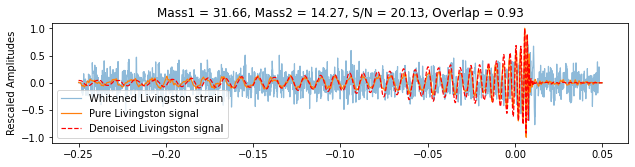

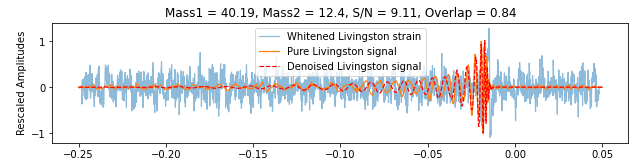

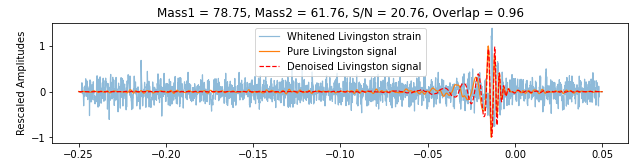

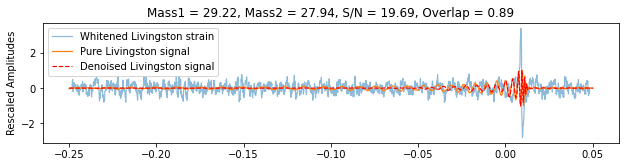

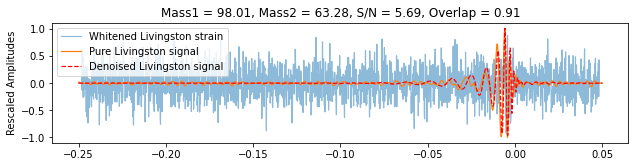

...

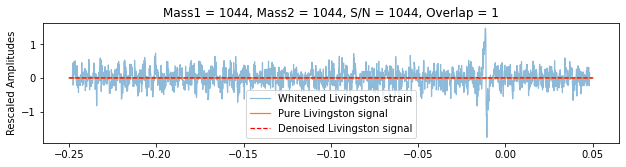

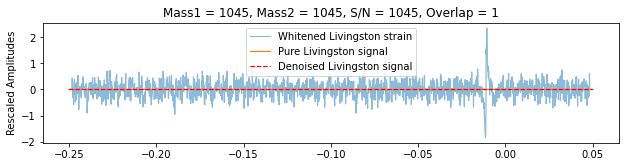

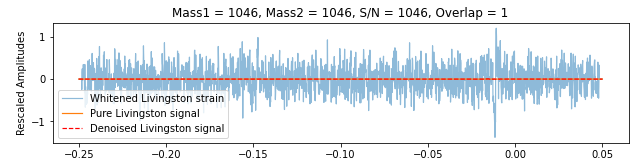

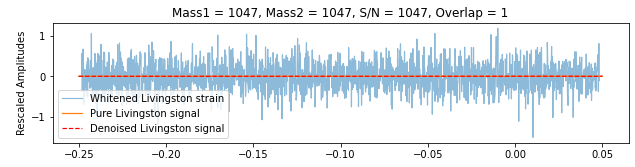

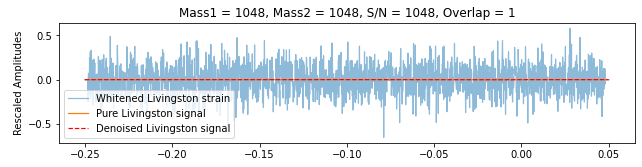

In [4]:
f1 = h5py.File('/fred/oz016/Chayan/GW-Denoiser/evaluation/results_IMRPhenomXPHM_25_timesteps_O3b_signal_noise_SNR-8to30_mchirp_all_dilated_CNN_1.hdf', 'r')
f2 = h5py.File("/fred/oz016/Chayan/BBH_sample_files/O3b_IMBH_test_IMRPhenomXPHM_signal_noise_SNR-8to40_mchirp_all.hdf", "r")

noise_index = range(100,125)
signal_index = range(25)
j = -1
   
for i in range(25):
    decoded_signals = f1['denoised_signals'][i].astype(np.float64)
    pure_signals = f1['pure_signals'][i].astype(np.float64)
    
    j+=1
    
    strain = np.pad(f2['injection_samples']['l1_strain'][j].astype(np.float64), (12,13), constant_values=(0,0))
    
    m1 = f2['injection_parameters']['mass1'][i]
    m2 = f2['injection_parameters']['mass2'][i]
    snr = f2['injection_parameters']['l1_snr'][j]*f2['injection_parameters']['scale_factor'][j]
    
    plot_reconstructed(decoded_signals, pure_signals, strain, m1, m2, snr)

j = -1

for i in range(25,50):
    
    j+=1
    pure_signals = np.pad(f2['noise_parameters']['l1_signal_whitened'][j].astype(np.float64), (12,13), constant_values=(0,0))     
    strain = np.pad(f2['noise_samples']['l1_strain'][j].astype(np.float64), (12,13), constant_values=(0,0))
    
    m1 = 999 + i
    m2 = 999 + i
    snr = 999 + i
        
    plot_reconstructed(f1['denoised_signals'][i].squeeze().astype(np.float64), pure_signals, strain, m1, m2, snr)
    

(array([0.03574875, 0.01191625, 0.0238325 , 0.00595813, 0.01191625,
        0.        , 0.00595813, 0.01787438, 0.01787438, 0.01787438]),
 array([12.84660287, 19.5601241 , 26.27364532, 32.98716655, 39.70068777,
        46.414209  , 53.12773022, 59.84125145, 66.55477267, 73.2682939 ,
        79.98181512]),
 <BarContainer object of 10 artists>)

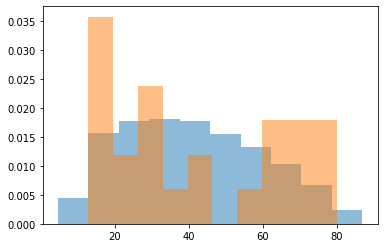

In [8]:
f1 = h5py.File("/fred/oz016/Chayan/BBH_sample_files/O3b_IMBH_train_IMRPhenomXPHM_signal_noise_SNR-8to40_mchirp_all.hdf", "r")
f2 = h5py.File("/fred/oz016/Chayan/BBH_sample_files/O3b_IMBH_test_IMRPhenomXPHM_signal_noise_SNR-8to40_mchirp_all.hdf", "r")

m1_train = f1['injection_parameters']['mass1'][()]
m2_train = f1['injection_parameters']['mass2'][()]

mchirp_train = ((m1_train*m2_train)**(3.0/5.0))/((m1_train+m2_train)**(1.0/5.0))

m1_test = f2['injection_parameters']['mass1'][()]
m2_test = f2['injection_parameters']['mass2'][()]

mchirp_test = ((m1_test*m2_test)**(3.0/5.0))/((m1_test+m2_test)**(1.0/5.0))

plt.hist(mchirp_train,alpha=0.5,density=True)
plt.hist(mchirp_test,alpha=0.5,density=True)


In [ ]:
l1_snr_train = f1['injection_parameters']['l1_snr'][()]*f1['injection_parameters']['scale_factor'][()]
l1_snr_test = f2['injection_parameters']['l1_snr'][()]*f2['injection_parameters']['scale_factor'][()]

plt.hist(l1_snr_train,alpha=0.5,density=True)
plt.hist(l1_snr_test,alpha=0.5,density=True)


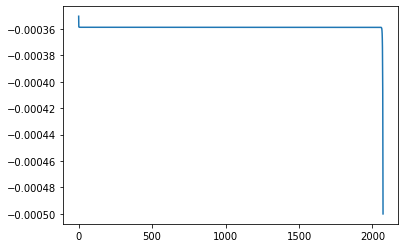

In [2]:
f1 = h5py.File('/fred/oz016/Chayan/GW-Denoiser/evaluation/results_IMRPhenomXPHM_25_timesteps_O3b_signal_noise_SNR-8to30_mchirp_all_dilated_CNN.hdf', 'r')
plt.plot(f1['denoised_signals'][2])


# New model not time distributed

In [3]:
from pycbc.filter import match, overlap
from pycbc.psd import aLIGOZeroDetHighPower
from pycbc.types.timeseries import TimeSeries
import matplotlib.pyplot as plt

def plot_reconstructed(decoded_signals, pure_signals, strain, m1, m2, snr):
    
    time_buffer = 4
    length_signal = len(decoded_signals)

    f_low = 18
    sample_rate = 2048

    # Length of corresponding time series and frequency series
    tlen = sample_rate * time_buffer
    flen = tlen // 2 + 1

    delta_f = 1.0 / time_buffer
    psd = aLIGOZeroDetHighPower(flen, delta_f, f_low)
    
    X_test_pure_ts = TimeSeries(pure_signals.squeeze(), delta_t = 1.0/2048)
    decoded_signals_ts = TimeSeries(decoded_signals.squeeze(), delta_t = 1.0/2048)

    X_test_pure_ts.resize(tlen)
    decoded_signals_ts.resize(tlen)

    if(X_test_pure_ts.max() != 0.0):
        m = Overlap_calc(X_test_pure_ts,decoded_signals_ts,psd)
    else:
        m = 1
    
    fig = plt.figure(figsize=(10,5))

    time = np.linspace(-0.25, 0.05, length_signal)

    plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.4, 
                    hspace=0.4)

    signal_axes = fig.add_subplot(211)
#    signal_axes.set_ylim(-1.1, 1.1)
    signal_axes.set_title('Mass1 = {m1}, Mass2 = {m2}, S/N = {snr}, Overlap = {m}'.format(m1=np.round(m1,2), m2=np.round(m2,2), snr=np.round(snr,2), m=np.round(m,2)))
    signal_axes.plot(time,strain.squeeze()/0.05, linewidth=1.2, label ='Whitened Livingston strain', alpha=0.5)
    signal_axes.plot(time,pure_signals.squeeze(), linewidth=1.2, label ='Pure Livingston signal')
    signal_axes.plot(time,decoded_signals.squeeze(), linewidth=1.2, label ='Denoised Livingston signal', c='red', linestyle='dashed')
    signal_axes.set_ylabel('Rescaled Amplitudes')
    signal_axes.legend()

    plt.savefig('IMBH_test/IMRPhenomXPHM_O3b_signal+noise_dilated_conv_MAE/Plot_m1-'+str(int(m1))+'_m2-'+str(int(m2))+'_snr-'+str(int(snr))+'.png', bbox_inches='tight', facecolor='w', transparent=False, dpi=200)


In [ ]:
f1 = h5py.File('/fred/oz016/Chayan/GW-Denoiser/evaluation/results_IMRPhenomXPHM_O3b_signal_noise_SNR-8to30_mchirp_all_new_model.hdf', 'r')
f2 = h5py.File("/fred/oz016/Chayan/BBH_sample_files/O3b_IMBH_test_IMRPhenomXPHM_signal_noise_SNR-8to40_mchirp_all.hdf", "r")

noise_index = range(100,125)
signal_index = range(25)
j = -1
   
for i in range(25):
    decoded_signals = f1['denoised_signals'][i].astype(np.float64)
    pure_signals = f1['pure_signals'][i].astype(np.float64)
    
    j+=1
    
    strain = f2['injection_samples']['l1_strain'][j].astype(np.float64)
    
    m1 = f2['injection_parameters']['mass1'][i]
    m2 = f2['injection_parameters']['mass2'][i]
    snr = f2['injection_parameters']['l1_snr'][j]*f2['injection_parameters']['scale_factor'][j]
    
    plot_reconstructed(decoded_signals, pure_signals, strain, m1, m2, snr)

j = -1

for i in range(25,50):
    
    j+=1
    pure_signals = f2['noise_parameters']['l1_signal_whitened'][j].astype(np.float64)     
    strain = f2['noise_samples']['l1_strain'][j].astype(np.float64)
    
    m1 = 999 + i
    m2 = 999 + i
    snr = 999 + i
        
    plot_reconstructed(f1['denoised_signals'][i].squeeze().astype(np.float64), pure_signals, strain, m1, m2, snr)
    

<ipython-input-3-729b44544052>:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(10,5))
